## Headers

In [10]:
# Import essential libraries for numerical operations, data handling, model building, and visualization

import numpy as np                      # For numerical computations and array operations
import pandas as pd                     # For data manipulation and DataFrame handling
import os                               # For file and directory operations
import tensorflow as tf                 # For building and training deep learning models
from tqdm import tqdm                   # For progress bars in loops (e.g., feature extraction)

# Keras preprocessing utilities
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Keras utilities for data generation and one-hot encoding
from tensorflow.keras.utils import Sequence, to_categorical

# Keras model building tools
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, Dropout, Flatten, Dense, Input, Layer
from tensorflow.keras.layers import Embedding, LSTM, add, Concatenate, Reshape, concatenate, Bidirectional

# Pre-trained CNN architectures for feature extraction (Baseline Model)
from tensorflow.keras.applications import VGG16, ResNet50, DenseNet201

# Optimizer for model training
from tensorflow.keras.optimizers import Adam

# Callbacks for training management
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# Suppress warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')

# Visualization libraries for EDA and results analysis
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import wrap                # For wrapping long text (captions) in plots


warnings.filterwarnings('ignore')

In [11]:
# Mounting google drive in colab to access files and datasets stored in the drive
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

## EDA

In [12]:
# Define the path to the Flickr8k image dataset in Google Drive
#image_path = "/content/drive/MyDrive/flickr8k/Images"
image_path = "Images"
# Load the Flickr8k captions CSV file into a DataFrame
#data = pd.read_csv("/content/drive/MyDrive/flickr8k/captions.txt")
data = pd.read_csv("captions.txt")

# Display the first few rows of the loaded captions data for inspection
data.head()


,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...


In [13]:
# Function to load and preprocess an image (resizes and scales pixel values)
def readImage(path, img_size=224):
    """
    Reads an image from the given path, resizes it to (img_size, img_size),
    and normalizes pixel values to [0,1].
    """
    img = load_img(path, color_mode='rgb', target_size=(img_size, img_size))  # Load and resize image
    img = img_to_array(img) / 255.0  # Convert to array and scale
    return img

# Function to display a grid of 15 random images and their corresponding captions
def display_images(temp_df):
    """
    Displays a 5x5 grid of 15 images and their captions from the given DataFrame.
    """
    temp_df = temp_df.reset_index(drop=True)  # Reset DataFrame index for safety
    plt.figure(figsize=(20, 20))

    n = 0  # Counter for subplot indexing
    for i in range(15):
        n += 1
        plt.subplot(5, 5, n)
        plt.subplots_adjust(hspace=0.7, wspace=0.3)
        
        # Read and display the image
        image = readImage(f"{image_path}/{temp_df.image[i]}")
        plt.imshow(image)
        
        # Display the corresponding caption (wrapped to 20 characters per line)
        plt.title("\n".join(wrap(temp_df.caption[i], 20)))
        plt.axis("off")  # Remove axis lines


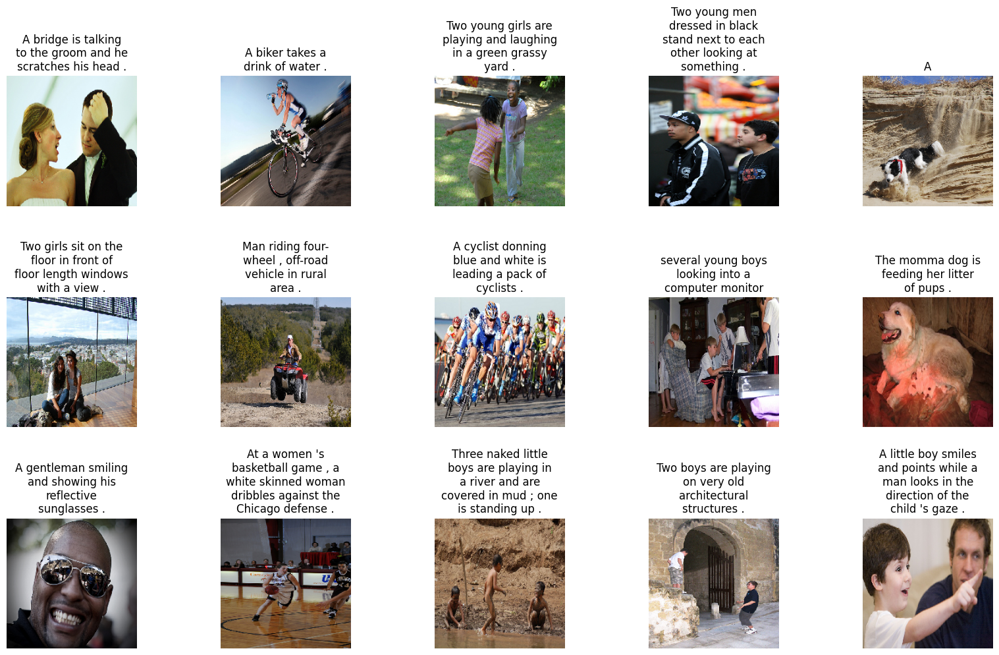

In [14]:
display_images(data.sample(15))

In [15]:
# Function to preprocess captions: lowercasing, cleaning, and adding start/end tokens
def text_preprocessing(data):
    """
    Cleans and formats captions:
    - Lowercases text
    - Removes special characters (currently: attempted regex, needs fix)
    - Removes extra spaces
    - Removes single-character words
    - Adds 'startseq' and 'endseq' tokens
    """
    # Convert captions to lowercase
    data['caption'] = data['caption'].apply(lambda x: x.lower())

    # Remove special characters (INTENDED: regex replacement, but currently replaces literal string)
    data['caption'] = data['caption'].apply(lambda x: x.replace("[^A-Za-z]", ""))

    # Remove extra spaces (INTENDED: regex replacement, but currently literal string)
    data['caption'] = data['caption'].apply(lambda x: x.replace("\s+", " "))

    # Remove single-letter words
    data['caption'] = data['caption'].apply(lambda x: " ".join([word for word in x.split() if len(word) > 1]))

    # Add start and end tokens for training sequence generation
    data['caption'] = "startseq " + data['caption'] + " endseq"

    return data


In [16]:
# Apply text preprocessing function to the captions DataFrame
data = text_preprocessing(data)

# Convert cleaned captions into a list format for tokenization and model input
captions = data['caption'].tolist()

# Display the first 10 processed captions as a quick sanity check
captions[:10]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq',
 'startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tri-colored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq']

In [17]:
# === Tokenizer setup ===

# Initialize Keras Tokenizer to build vocabulary from captions
tokenizer = Tokenizer()

# Fit tokenizer on the preprocessed captions
tokenizer.fit_on_texts(captions)

# Get total vocabulary size (add 1 for padding token)
vocab_size = len(tokenizer.word_index) + 1

# Find the maximum caption length (in words) for padding/truncation
max_length = max(len(caption.split()) for caption in captions)

# === Image list creation and train-test split ===

# Get unique image filenames from the dataset
images = data['image'].unique().tolist()
nimages = len(images)

# Define train-test split index (85% train, 15% validation)
split_index = round(0.85 * nimages)

# Split image filenames into training and validation sets
train_images = images[:split_index]
val_images = images[split_index:]

# Filter dataset based on split image lists
train = data[data['image'].isin(train_images)]
test = data[data['image'].isin(val_images)]

# Reset indices for both train and test sets
train.reset_index(inplace=True, drop=True)
test.reset_index(inplace=True, drop=True)

# === Example: Convert a single caption to sequence of token IDs
tokenizer.texts_to_sequences([captions[1]])[0]

[1, 18, 315, 63, 195, 116, 2]

In [18]:
# === Extract Image Features using DenseNet201 (LSTM+CNN Baseline) ===

# Load DenseNet201 pre-trained model (from ImageNet) for feature extraction
model = DenseNet201()  # Includes top layers by default
fe = Model(inputs=model.input, outputs=model.layers[-2].output)  # Extract features from the second-to-last layer

# Set image size for DenseNet201 input (default: 224x224)
img_size = 224

# Initialize dictionary to store features for each image
features = {}

# Loop over all unique images in the dataset
for image in tqdm(data['image'].unique().tolist()):
    # Load and preprocess the image
    img = load_img(os.path.join(image_path, image), target_size=(img_size, img_size))
    img = img_to_array(img) / 255.0  # Normalize pixel values
    img = np.expand_dims(img, axis=0)  # Add batch dimension

    # Extract CNN features
    feature = fe.predict(img, verbose=0)

    # Store feature vector in dictionary (key: image filename)
    features[image] = feature

100%|██████████| 8091/8091 [10:55<00:00, 12.35it/s]


In [19]:
# === Custom Data Generator for LSTM+CNN Model Training ===
# Inherits from Keras Sequence class for efficient data generation during model.fit()

class CustomDataGenerator(Sequence):
    
    def __init__(self, df, X_col, y_col, batch_size, directory, tokenizer,
                 vocab_size, max_length, features, shuffle=True):
        """
        Initialize the custom data generator.
        
        Parameters:
        - df: DataFrame containing image names and captions
        - X_col: Column name for image filenames
        - y_col: Column name for captions
        - batch_size: Number of samples per batch
        - directory: Image directory (not used directly here; kept for flexibility)
        - tokenizer: Fitted Keras Tokenizer for caption text
        - vocab_size: Vocabulary size for one-hot encoding
        - max_length: Max sequence length for padding
        - features: Dictionary of pre-extracted image features
        - shuffle: Shuffle data after each epoch
        """
        self.df = df.copy()
        self.X_col = X_col
        self.y_col = y_col
        self.directory = directory
        self.batch_size = batch_size
        self.tokenizer = tokenizer
        self.vocab_size = vocab_size
        self.max_length = max_length
        self.features = features
        self.shuffle = shuffle
        self.n = len(self.df)

    def on_epoch_end(self):
        """
        Shuffle data at the end of each epoch (if enabled).
        """
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)

    def __len__(self):
        """
        Return the number of batches per epoch.
        """
        return self.n // self.batch_size

    def __getitem__(self, index):
        """
        Generate one batch of data.
        """
        batch = self.df.iloc[index * self.batch_size:(index + 1) * self.batch_size, :]
        X1, X2, y = self.__get_data(batch)
        return (X1, X2), y

    def __get_data(self, batch):
        """
        Process a batch: prepare image features (X1), padded captions (X2), and target words (y).
        """
        X1, X2, y = list(), list(), list()
        images = batch[self.X_col].tolist()

        for image in images:
            # Get pre-extracted image feature vector
            feature = self.features[image][0]

            # Get all captions for the image
            captions = batch.loc[batch[self.X_col] == image, self.y_col].tolist()
            for caption in captions:
                seq = self.tokenizer.texts_to_sequences([caption])[0]

                # For each word in the sequence, create (input, output) pairs
                for i in range(1, len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=self.max_length)[0]
                    out_seq = to_categorical([out_seq], num_classes=self.vocab_size)[0]
                    
                    # Append to batch
                    X1.append(feature)
                    X2.append(in_seq)
                    y.append(out_seq)

        # Convert lists to numpy arrays
        X1, X2, y = np.array(X1), np.array(X2), np.array(y)

        return X1, X2, y


## LSTM + CNN Image Captioning Model Architecture (Baseline)


In [20]:
# === LSTM + CNN Image Captioning Model Architecture (Baseline) ===

# Input for image features (DenseNet201 output: 1920-dimensional vector)
input1 = Input(shape=(1920,))  # Shape: (batch_size, 1920)

# Input for caption sequences (token IDs)
input2 = Input(shape=(max_length,))  # Shape: (batch_size, max_length)

# Process image features: Dense layer to reduce dimensionality
img_features = Dense(256, activation='relu')(input1)  # Shape: (batch_size, 256)
img_features_reshaped = Reshape((1, 256), input_shape=(256,))(img_features)  # Shape: (batch_size, 1, 256)

# Process caption input: Embedding layer maps tokens to dense vectors
sentence_features = Embedding(vocab_size, 256, mask_zero=False)(input2)  # Shape: (batch_size, max_length, 256)

# Concatenate image feature and caption embeddings along the sequence axis
merged = concatenate([img_features_reshaped, sentence_features], axis=1)  # Shape: (batch_size, max_length+1, 256)

# LSTM layer processes the combined sequence (image + text)
sentence_features = LSTM(256)(merged)  # Output: (batch_size, 256)

# Add dropout for regularization
x = Dropout(0.5)(sentence_features)

# Skip connection: Add image features (256-dim) to LSTM output
x = add([x, img_features])

# Dense layer for further processing
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)

# Final output layer: Predict next word in sequence (vocab_size categories)
output = Dense(vocab_size, activation='softmax')(x)

# Define the complete model: Inputs = [image feature, caption tokens]; Output = next word probabilities
caption_model = Model(inputs=[input1, input2], outputs=output)

# Compile the model with categorical crossentropy loss and Adam optimizer
caption_model.compile(loss='categorical_crossentropy', optimizer='adam')


In [21]:
caption_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 1920)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    491,776 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_3       │ (None, 34)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 256)    │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 34, 256)   │  2,172,160 │ input_layer_3[0]… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 35, 256)   │          0 │ reshape[0][0],    │
│ (Concatenate)       │                   │            │ embedding[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 256)       │    525,312 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 256)       │          0 │ lstm[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 256)       │          0 │ dropout[0][0],    │
│                     │                   │            │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 128)       │     32,896 │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 128)       │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 8485)      │  1,094,565 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 4,316,709 (16.47 MB)

 Trainable params: 4,316,709 (16.47 MB)

 Non-trainable params: 0 (0.00 B)

In [22]:
# === Create Data Generators for Training and Validation (LSTM+CNN Baseline) ===

# Initialize training data generator:
# - Provides (image features, caption tokens) -> next word prediction batches for training the LSTM model
train_generator = CustomDataGenerator(
    df=train,
    X_col='image',          # Column with image filenames
    y_col='caption',        # Column with processed captions
    batch_size=64,          # Batch size for training
    directory=image_path,   # Image directory (not used directly; kept for flexibility)
    tokenizer=tokenizer,    # Fitted tokenizer for text preprocessing
    vocab_size=vocab_size,  # Total vocabulary size
    max_length=max_length,  # Max caption length for padding
    features=features       # Pre-extracted CNN features for images
)

# Initialize validation data generator:
# - Used for evaluating model performance during training
validation_generator = CustomDataGenerator(
    df=test,
    X_col='image',
    y_col='caption',
    batch_size=64,
    directory=image_path,
    tokenizer=tokenizer,
    vocab_size=vocab_size,
    max_length=max_length,
    features=features
)


In [23]:
# === Callbacks for Model Training (LSTM+CNN Baseline) ===

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Save the model with the lowest validation loss
checkpoint = ModelCheckpoint(
    'model.keras',          # Save model in Keras format
    monitor='val_loss',     # Monitor validation loss
    save_best_only=True,    # Save only the best model (lowest val_loss)
    save_weights_only=False,
    verbose=1
)

# Stop training early if no improvement in validation loss for 2 epochs
earlystopping = EarlyStopping(
    monitor='val_loss',
    patience=2,              # Number of epochs to wait
    restore_best_weights=True,
    verbose=1
)

# Reduce learning rate if validation loss plateaus
learning_rate_reduction = ReduceLROnPlateau(
    monitor='val_loss',
    patience=2,              # Number of epochs with no improvement
    factor=0.5,              # Reduce learning rate by half
    min_lr=1e-6,             # Lower bound on learning rate
    verbose=1
)

# === Train the LSTM+CNN Baseline Model ===
history = caption_model.fit(
    train_generator,                     # Training data generator
    epochs=50,                           # Max number of epochs
    validation_data=validation_generator, # Validation data generator
    callbacks=[checkpoint, earlystopping, learning_rate_reduction],  # Use defined callbacks
    verbose=1
)

Epoch 1/50
537/537 ━━━━━━━━━━━━━━━━━━━━ 0s 348ms/step - loss: 5.7265
Epoch 1: val_loss improved from inf to 4.31068, saving model to model.keras
537/537 ━━━━━━━━━━━━━━━━━━━━ 207s 383ms/step - loss: 5.7254 - val_loss: 4.3107 - learning_rate: 0.0010
Epoch 2/50
537/537 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step - loss: 4.3581
Epoch 2: val_loss improved from 4.31068 to 3.98571, saving model to model.keras
537/537 ━━━━━━━━━━━━━━━━━━━━ 234s 436ms/step - loss: 4.3580 - val_loss: 3.9857 - learning_rate: 0.0010
Epoch 3/50
537/537 ━━━━━━━━━━━━━━━━━━━━ 0s 455ms/step - loss: 4.0433
Epoch 3: val_loss improved from 3.98571 to 3.82355, saving model to model.keras
537/537 ━━━━━━━━━━━━━━━━━━━━ 266s 495ms/step - loss: 4.0433 - val_loss: 3.8235 - learning_rate: 0.0010
Epoch 4/50
537/537 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 3.8411
Epoch 4: val_loss improved from 3.82355 to 3.74048, saving model to model.keras
537/537 ━━━━━━━━━━━━━━━━━━━━ 1096s 2s/step - loss: 3.8411 - val_loss: 3.7405 - learning_rate: 0.0010
E

### Plot Training and Validation Loss Curves (LSTM+CNN Baseline)

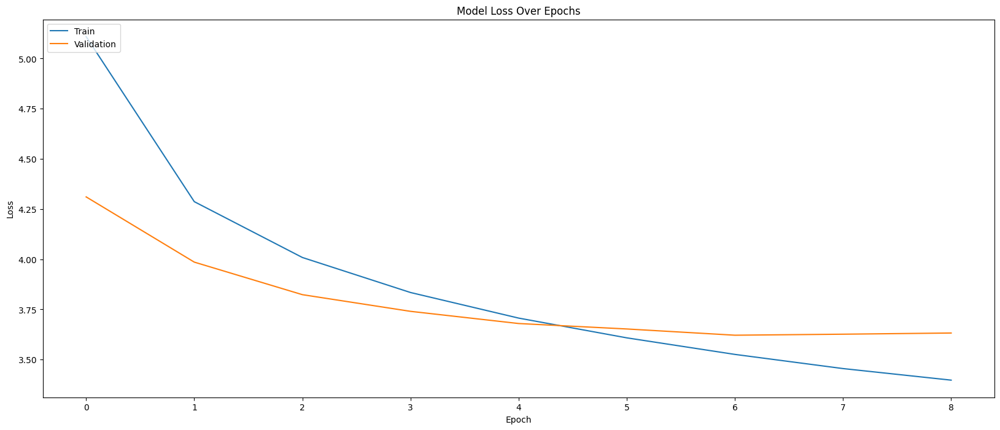

In [25]:
# Set up a large figure for clear visualization
plt.figure(figsize=(20, 8))

# Plot training loss across epochs
plt.plot(history.history['loss'])

# Plot validation loss across epochs
plt.plot(history.history['val_loss'])

# Add plot title and labels
plt.title('Model Loss Over Epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')

# Add legend to differentiate training and validation lines
plt.legend(['Train', 'Validation'], loc='upper left')

# Display the plot
plt.show()

In [ ]:
# Install the Natural Language Toolkit (NLTK) library for text processing and evaluation
# NLTK provides tools like BLEU score calculation for evaluating caption quality
!pip install nltk


In [26]:
# === Generate Captions for Randomly Sampled Images (LSTM+CNN Baseline) ===

# Select 15 random samples from the test set
samples = test.sample(15)
samples.reset_index(drop=True, inplace=True)

# Function to generate a caption for a given image using the trained model (greedy search)
def predict_caption(model, image_name, tokenizer, max_length, features):
    """
    Generates a caption for a given image using greedy decoding.
    """
    in_text = 'startseq'  # Start token

    for _ in range(max_length):
        # Convert current partial caption into a sequence of token IDs
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen=max_length)

        # Predict the next word
        yhat = model.predict([features[image_name], sequence], verbose=0)
        yhat = np.argmax(yhat)

        # Map predicted token back to word
        word = tokenizer.index_word.get(yhat)
        if word is None:
            break

        # Append predicted word to the caption
        in_text += ' ' + word
        if word == 'endseq':
            break

    # Clean up the generated caption by removing special tokens
    final_caption = in_text.replace('startseq', '').replace('endseq', '').strip()
    return final_caption

# Loop over each sampled image and generate captions
for index, record in samples.iterrows():
    # Load and preprocess the image (for visualization only, not used in model prediction here)
    img = load_img(os.path.join(image_path, record['image']), target_size=(224, 224))
    img = img_to_array(img) / 255.0

    # Generate predicted caption for the image using the trained model
    caption = predict_caption(caption_model, record['image'], tokenizer, max_length, features)

    # Replace the existing caption in the sample DataFrame with the generated caption
    samples.loc[index, 'caption'] = caption


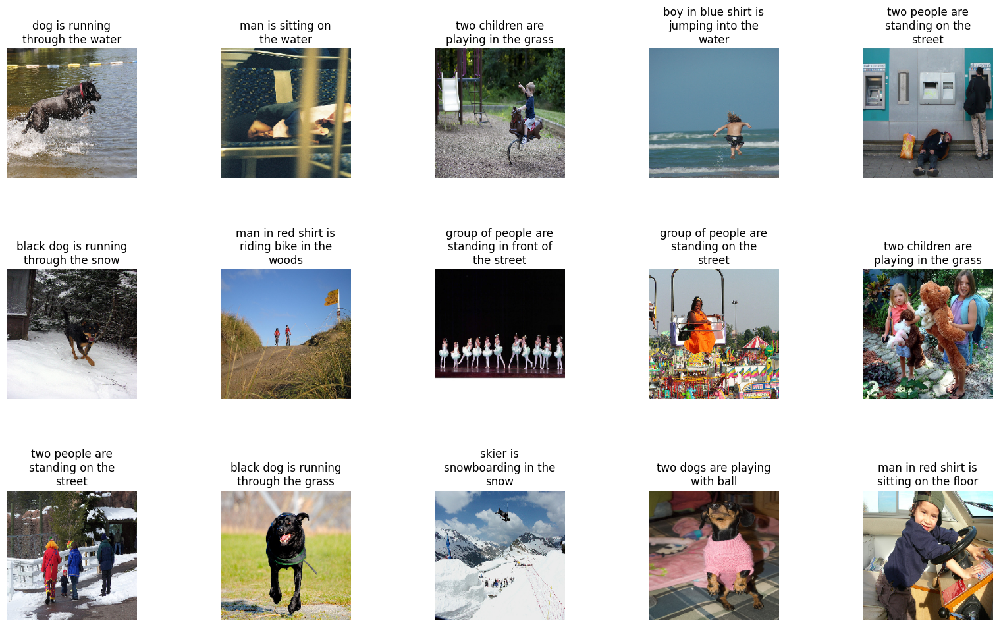

In [27]:
display_images(samples)

In [28]:
# === Create Data Generators for LSTM+CNN Model ===

# Training data generator: Feeds (image features, partial captions) → next word batches for model training
train_generator = CustomDataGenerator(
    df=train,
    X_col='image',          # Column containing image filenames
    y_col='caption',        # Column containing processed captions
    batch_size=64,
    directory=image_path,   # Directory (not used directly; placeholder for flexibility)
    tokenizer=tokenizer,    # Fitted Keras Tokenizer for caption text
    vocab_size=vocab_size,  # Total vocabulary size
    max_length=max_length,  # Maximum length of captions
    features=features       # Pre-extracted DenseNet201 image features
)

# Validation data generator: Feeds validation batches for model evaluation during training
validation_generator = CustomDataGenerator(
    df=test,
    X_col='image',
    y_col='caption',
    batch_size=64,
    directory=image_path,
    tokenizer=tokenizer,
    vocab_size=vocab_size,
    max_length=max_length,
    features=features
)

# === Internal Data Generator Method: Prepares One Batch of Data ===

def __get_data(self, batch):
    """
    Generates one batch of data:
    - X1: Image features
    - X2: Partial caption sequences (tokenized & padded)
    - y: One-hot encoded next word in caption
    """
    X1, X2, y = list(), list(), list()

    images = batch[self.X_col].tolist()  # Get list of image filenames in batch

    for image in images:
        feature = self.features[image][0]  # Get pre-extracted CNN features for image

        # Get all captions corresponding to the image
        captions = batch.loc[batch[self.X_col] == image, self.y_col].tolist()
        for caption in captions:
            seq = self.tokenizer.texts_to_sequences([caption])[0]  # Convert caption to sequence

            # Create multiple (input, output) pairs for sequence generation
            for i in range(1, len(seq)):
                in_seq, out_seq = seq[:i], seq[i]

                # Pad input sequence to max_length
                in_seq = pad_sequences([in_seq], maxlen=self.max_length)[0]

                # One-hot encode output word (next word to predict)
                out_seq = to_categorical([out_seq], num_classes=self.vocab_size, dtype=np.float32)[0]

                X1.append(feature)
                X2.append(in_seq)
                y.append(out_seq)

    # Convert lists to numpy arrays with appropriate data types
    X1 = np.array(X1, dtype=np.float32)  # Image features
    X2 = np.array(X2, dtype=np.int32)    # Padded token sequences
    y = np.asarray(y, dtype=np.float32)  # One-hot encoded target words

    return X1, X2, y

In [29]:
# === Sanity Check: Verify Data Generator Outputs ===

# Fetch the first batch from the training data generator
(sample_X1, sample_X2), sample_y = train_generator[0]

# Display the shapes and data types of the batch components
print("Sample Image Feature Shape:", sample_X1.shape, "Type:", sample_X1.dtype)  # Expected: (batch_size, 1920)
print("Sample Caption Input Shape:", sample_X2.shape, "Type:", sample_X2.dtype)  # Expected: (batch_size, max_length)
print("Sample Output Shape:", sample_y.shape, "Type:", sample_y.dtype)           # Expected: (batch_size, vocab_size)


Sample Image Feature Shape: (3543, 1920) Type: float32
Sample Caption Input Shape: (3543, 34) Type: int32
Sample Output Shape: (3543, 8485) Type: float64


In [30]:
# === Utility Function: Convert Token Index to Word ===
def idx_to_word(integer, tokenizer):
    """
    Maps an integer index back to its corresponding word using the tokenizer.
    """
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None  # Return None if index not found


# === Generate Caption for a Given Image (Greedy Decoding for LSTM+CNN Baseline) ===
def predict_caption(model, image, tokenizer, max_length, features):
    """
    Generates a caption for an image using the trained LSTM+CNN model.
    - model: Trained Keras captioning model
    - image: Image filename (key for feature dictionary)
    - tokenizer: Fitted tokenizer
    - max_length: Maximum caption length
    - features: Dictionary of pre-extracted image features (DenseNet201)
    
    Returns:
    - A generated caption as a string
    """
    feature = features[image]  # Get pre-extracted CNN features for the image
    in_text = "startseq"       # Initialize caption with start token

    # Generate words one by one up to max_length
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]  # Convert caption so far to token IDs
        sequence = pad_sequences([sequence], max_length)       # Pad sequence for model input

        y_pred = model.predict([feature, sequence])            # Predict next word probabilities
        y_pred = np.argmax(y_pred)                             # Get the most probable word index

        word = idx_to_word(y_pred, tokenizer)                  # Convert index back to word
        if word is None:
            break

        in_text += " " + word                                  # Append predicted word to caption

        if word == 'endseq':                                   # Stop if end token is predicted
            break

    return in_text


In [31]:
# === Generate Captions for Randomly Sampled Images (LSTM+CNN Baseline) ===

# Select a random sample of 15 images from the test set for caption generation
samples = test.sample(15)
samples.reset_index(drop=True, inplace=True)  # Reset index for clean iteration

# Loop through each sampled image and generate a caption using the trained model
for index, record in samples.iterrows():

    # Load and preprocess the image (for visualization, not used in model prediction here)
    img = load_img(os.path.join(image_path, record['image']), target_size=(224, 224))
    img = img_to_array(img) / 255.0

    # Generate caption using the trained LSTM+CNN model (greedy decoding)
    caption = predict_caption(caption_model, record['image'], tokenizer, max_length, features)

    # Replace the ground-truth caption in the sample DataFrame with the generated caption
    samples.loc[index, 'caption'] = caption

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━

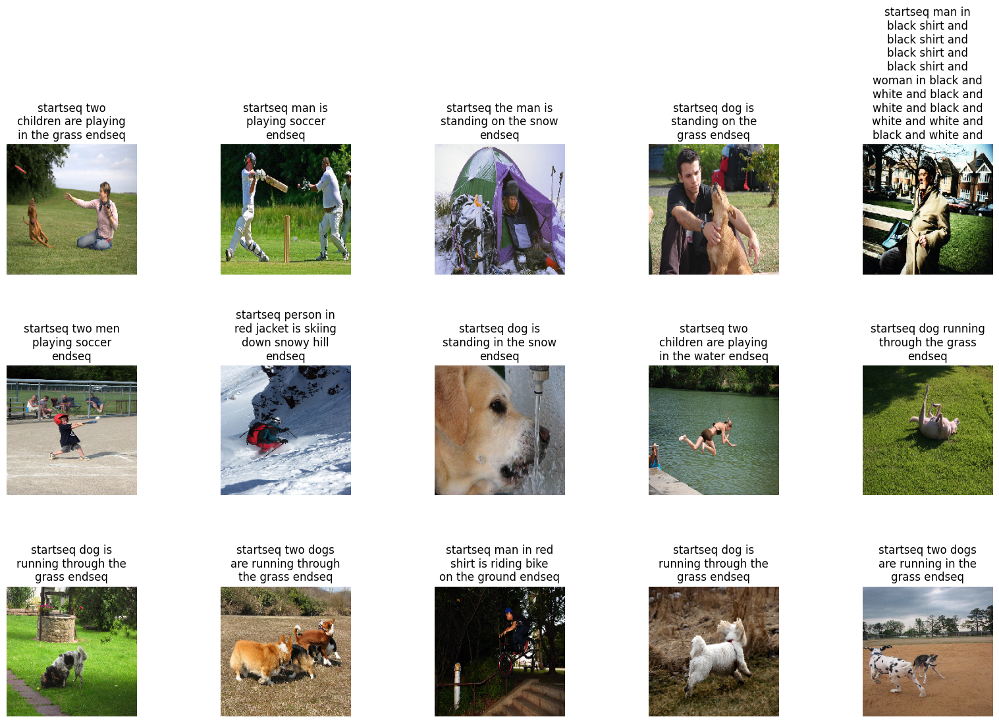

In [32]:
# Displaying the samples
display_images(samples)

# Summary uptil now 

We have built and trained an image captioning pipeline using a DenseNet201 feature extractor and an LSTM decoder. The model takes pre-extracted image features and partial captions as input and predicts the next word to generate a complete caption for an image. We preprocessed the captions by lowercasing, removing special characters, and adding start and end tokens. After training the model, we tested it on random images from the Flickr8k dataset.

The output shows a grid of images with generated captions from the LSTM+CNN model. Each caption starts with `startseq` and ends with `endseq`, which indicates the start and end tokens. These captions provide basic but sensible descriptions of the images, showing the model is learning the relationships between images and captions.


### Baseline model saved in "caption_model.h5"

You can later load this model with:

from tensorflow.keras.models import load_model
loaded_model = load_model("caption_model.h5")


Combine this with your saved tokenizer and features:

with open("tokenizer.pkl", "rb") as f:
    tokenizer = pickle.load(f)

with open("features.pkl", "rb") as f:
    features = pickle.load(f)



In [33]:
import pickle

# === Save the fitted tokenizer for future use (e.g., during inference or evaluation) ===
with open("tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)

# === Save the pre-extracted image features (DenseNet201) for efficient reuse ===
with open("features.pkl", "wb") as f:
    pickle.dump(features, f)

# === Save the trained LSTM+CNN model architecture and weights ===
caption_model.save("caption_model.h5")



### Model Export: LSTM+CNN to ONNX

In this step, we rebuild the LSTM+CNN baseline model architecture and load the saved weights (`caption_model.h5`). Then, we convert the model to ONNX format using the `tf2onnx` package. This makes the model compatible with different frameworks like PyTorch, TensorFlow, and others.

Key steps:

* Rebuild the model using `vocab_size` and `max_length`.
* Load the trained weights.
* Define the input signature for ONNX.
* Convert and save the model as `caption_model.onnx`.

This allows us to run the model in different environments that support ONNX.


In [ ]:
# Install the tf2onnx package for converting TensorFlow/Keras models to ONNX format
!pip install tf2onnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.8/455.8 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 111.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 19.1 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.6
    Uninstalling protobuf-4.25.6:
      Successfully uninstalled protobuf-4.25.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.17.1 requires protobuf<6.0.0,>=4.25.2; python_version >= "3.11", but you have protobuf 3.20.3 which is incompatible.
tensorflow-text 2.18.1 requires tensorflow<2.19,>=2.18.0, but you have tensorflow 2.12.0 which is incompatible.
bigframes 1.42.0 requires numpy>=1.24.0, but you have numpy 1.23.5 which is incompatible.
grpcio-status 1.71.0 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 3.

In [36]:
import os
import tensorflow as tf
import tf2onnx

# === Prepare constants for rebuilding the model ===
vocab_size = len(tokenizer.word_index) + 1  # Total vocabulary size (including padding)
max_length = max(len(c.split()) for c in data['caption'])  # Maximum length of captions

# === Rebuild the model architecture (must match training architecture) ===
def build_caption_model(vocab_size, max_length):
    """
    Rebuilds the LSTM+CNN image captioning model architecture for loading weights.
    """
    input1 = tf.keras.Input(shape=(1920,), name="image_features")  # Pre-extracted DenseNet201 features
    input2 = tf.keras.Input(shape=(max_length,), name="caption_sequence")  # Tokenized captions

    img_features = tf.keras.layers.Dense(256, activation='relu')(input1)
    img_features_reshaped = tf.keras.layers.Reshape((1, 256))(img_features)

    sentence_features = tf.keras.layers.Embedding(vocab_size, 256, mask_zero=False)(input2)
    merged = tf.keras.layers.Concatenate(axis=1)([img_features_reshaped, sentence_features])

    sentence_features = tf.keras.layers.LSTM(256)(merged)
    x = tf.keras.layers.Dropout(0.5)(sentence_features)
    x = tf.keras.layers.Add()([x, img_features])
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    output = tf.keras.layers.Dense(vocab_size, activation='softmax')(x)

    model = tf.keras.Model(inputs=[input1, input2], outputs=output)
    return model

# === Paths for loading and saving models ===
#model_path = "/content/caption_model.h5"
#onnx_model_path = "/content/caption_model.onnx"

model_path = "caption_model.h5"
onnx_model_path = "caption_model.onnx"

# === Load trained model weights and convert to ONNX format ===
if os.path.exists(model_path):
    print("Model file found! Rebuilding and loading weights...")

    caption_model = build_caption_model(vocab_size, max_length)  # Rebuild architecture
    caption_model.load_weights(model_path)  # Load trained weights
    print("Weights loaded successfully.")

    # Define input signature for ONNX conversion
    spec = (
        tf.TensorSpec([None, 1920], tf.float32, name="image_features"),
        tf.TensorSpec([None, max_length], tf.int32, name="caption_sequence")
    )

    print("Converting model to ONNX format...")
    model_proto, _ = tf2onnx.convert.from_keras(
        caption_model,
        input_signature=spec,
        opset=13,  # ONNX operator set version
        output_path=onnx_model_path
    )

    print("Model successfully converted to ONNX!")
    print("Saved at:", onnx_model_path)
else:
    print("Model file not found! Please check the path.")


Model file found! Rebuilding and loading weights...
Weights loaded successfully.
Converting model to ONNX format...


I0000 00:00:1748199332.822005 79344248 devices.cc:76] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0 (Note: TensorFlow was not compiled with CUDA or ROCm support)
I0000 00:00:1748199332.828543 79344248 single_machine.cc:374] Starting new session
I0000 00:00:1748199333.217030 79344248 devices.cc:76] Number of eligible GPUs (core count >= 8, compute capability >= 0.0): 0 (Note: TensorFlow was not compiled with CUDA or ROCm support)
I0000 00:00:1748199333.217108 79344248 single_machine.cc:374] Starting new session
I0000 00:00:1748199333.522903 79344248 mlir_graph_optimization_pass.cc:425] MLIR V1 optimization pass is not enabled
ERROR:tf2onnx.tfonnx:rewriter <function rewrite_constant_fold at 0x1580ab1a0>: exception `np.cast` was removed in the NumPy 2.0 release. Use `np.asarray(arr, dtype=dtype)` instead.
ERROR:tf2onnx.tfonnx:rewriter <function rewrite_constant_fold at 0x1580ab1a0>: exception `np.cast` was removed in the NumPy 2.0 release. Use `np.asarray(arr, dt

Model successfully converted to ONNX!
Saved at: caption_model.onnx


## YOLO

### Imports and setup for YOLOv5

In [37]:
# === Enable inline plotting in Jupyter/Colab ===
%matplotlib inline 

# === Mount Google Drive for dataset and model access ===
#from google.colab import drive
#drive.mount('/content/drive')

# === Import required libraries ===
import os
import numpy as np
import pickle
import torch
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import load_model
import nltk

# === Download NLTK resources (stopwords and tokenizer) ===
nltk.download("stopwords")
nltk.download("punkt")


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/vedclove/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/vedclove/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

### YOLOv5 Object Detection Setup

In [ ]:
# === Clone YOLOv5 repository for object detection ===
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

# === Install YOLOv5 dependencies ===
!pip install -r requirements.txt --quiet


In [38]:
# === Load the pre-trained YOLOv5s model (small version) ===
yolo_model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# === Define function to detect objects in an image using YOLOv5 ===
def detect_objects_yolo(image_path):
    results = yolo_model(image_path)
    labels = results.names  # Class labels
    detections = results.pred[0]  # Prediction results
    if detections is None or len(detections) == 0:
        return []
    class_ids = detections[:, -1].tolist()  # Extract class indices
    return list(set([labels[int(idx)] for idx in class_ids]))  # Return unique detected object labels

Using cache found in /Users/vedclove/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-5-23 Python-3.11.11 torch-2.7.0 CPU

100%|██████████| 14.1M/14.1M [00:01<00:00, 12.7MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


### Load Features, Tokenizer, Model, and Captions

In [39]:
# === Define paths for saved model components and data ===
#features_path = "/content/features.pkl"
#tokenizer_path = "/content/tokenizer.pkl"
#model_path = "/content/model.keras"
#captions_path = "/content/drive/MyDrive/flickr8k/captions.txt"
#images_path = "/content/drive/MyDrive/flickr8k/Images"

features_path = "features.pkl"
tokenizer_path = "tokenizer.pkl"
model_path = "model.keras"
captions_path = "captions.txt"
images_path = "Images"

# === Load pre-extracted image features ===
with open(features_path, "rb") as f:
    features = pickle.load(f)

# === Load trained tokenizer ===
with open(tokenizer_path, "rb") as f:
    tokenizer = pickle.load(f)

# === Load the trained LSTM+CNN model ===
caption_model = load_model(model_path)

# === Set maximum caption length (hardcoded) ===
max_length = 34

# === Load the original captions dataset ===
captions_df = pd.read_csv(captions_path)


### YOLOv5 Model Reload and Object Detection Function

In [40]:
# === Reload YOLOv5 model (if needed) ===
yolo_model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# === Define function to detect objects in an image using YOLOv5 ===
def detect_objects_yolo(image_path):
    results = yolo_model(image_path)
    labels = results.names  # Class labels
    detections = results.pred[0]  # Prediction results
    if detections is None or len(detections) == 0:
        return []
    class_ids = detections[:, -1].tolist()  # Extract class indices
    return list(set([labels[int(idx)] for idx in class_ids]))  # Return unique detected object labels


Using cache found in /Users/vedclove/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-5-23 Python-3.11.11 torch-2.7.0 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


### Caption Generation and Hallucination Filtering

In [41]:
# === Map token index to word using tokenizer ===
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

# === Generate caption for an image using trained LSTM+CNN model ===
def predict_caption(model, image_name, tokenizer, max_length, features):
    key = image_name
    if key not in features:
        key = os.path.splitext(image_name)[0]  # Remove file extension
    if key not in features:
        raise ValueError(f"Image {image_name} not found in feature keys.")

    feature = features[key]

    # Ensure feature shape is correct for model prediction
    if len(feature.shape) == 1:
        feature = np.expand_dims(feature, axis=0)
    elif len(feature.shape) == 2 and feature.shape[0] == 1:
        feature = feature
    elif len(feature.shape) == 2 and feature.shape[1] == 1:
        feature = feature.reshape(1, -1)
    elif len(feature.shape) == 3:
        feature = feature.squeeze(axis=1)

    in_text = "startseq"
    for _ in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([feature, sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = idx_to_word(yhat, tokenizer)
        if word is None or word == "endseq":
            break
        in_text += " " + word
    return in_text.replace("startseq", "").strip()

# === Filter hallucinated words from captions (retain objects detected by YOLO) ===
def filter_hallucinated_caption(caption, detected_objects):
    stop_words = set(stopwords.words("english"))
    words = caption.split()
    filtered = [word for word in words if word.lower().strip(".,") in detected_objects or word in stop_words]
    return " ".join(filtered)


### Sampling, Caption Generation, Filtering, and Visualization

This cell samples five random images from the dataset and:

Generates captions using the trained LSTM+CNN model.

Detects objects in the images using YOLOv5.

Filters out hallucinated words from the generated captions, keeping only detected objects and common stopwords.

Displays each image alongside:

The original (unfiltered) generated caption.

The filtered caption (after removing hallucinations).

The list of detected objects.

This visualization helps evaluate the model’s output and shows how object detection can refine captions.

In [42]:
# === Sample random rows from the captions DataFrame ===
sampled_rows = captions_df.sample(5).reset_index(drop=True)
results = []

# === Loop through each sampled image and process ===
for _, row in sampled_rows.iterrows():
    image_name = row['image']
    image_path_full = os.path.join(images_path, image_name)

    try:
        # Generate caption using the LSTM+CNN model
        caption = predict_caption(caption_model, image_name, tokenizer, max_length, features)

        # Detect objects in the image using YOLOv5
        detected = detect_objects_yolo(image_path_full)

        # Filter hallucinated words from the generated caption based on detected objects
        filtered = filter_hallucinated_caption(caption, detected)

        # Store results for display
        results.append({
            "image_path": image_path_full,
            "original_caption": caption,
            "filtered_caption": filtered,
            "detected": detected
        })

    except Exception as e:
        print(f"Error for {image_name}: {e}")

# === Visualize the sampled images, captions, filtered captions, and detected objects ===
fig, axes = plt.subplots(nrows=len(results), figsize=(14, 20))
for i, result in enumerate(results):
    image = Image.open(result["image_path"])
    axes[i].imshow(image)
    axes[i].axis("off")
    axes[i].set_title(
        f"Original: {result['original_caption']}\nFiltered: {result['filtered_caption']}\n📌 Detected: {result['detected']}",
        fontsize=10
    )
plt.tight_layout()
plt.show()


### BLEU Score Evaluation (Original vs Filtered Captions)

In [43]:
import nltk

# === Download necessary NLTK resources ===
nltk.download('punkt')       # Tokenizer for text splitting
nltk.download('punkt_tab')   # Tokenizer table (dependency)

from nltk.tokenize import word_tokenize
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction

# === Function to compute BLEU-1 and BLEU-2 scores ===
def compute_bleu_scores(references, hypotheses):
    smooth_fn = SmoothingFunction().method1
    bleu_1 = corpus_bleu(references, hypotheses, weights=(1, 0, 0, 0), smoothing_function=smooth_fn)
    bleu_2 = corpus_bleu(references, hypotheses, weights=(0.5, 0.5, 0, 0), smoothing_function=smooth_fn)
    return {"BLEU-1": bleu_1, "BLEU-2": bleu_2}

# === Prepare lists to store results ===
original_hyps, filtered_hyps, references = [], [], []

# === Sample 50 random images from the dataset for evaluation ===
sampled_test = captions_df.sample(50).reset_index(drop=True)

# === For each sampled image, generate captions and evaluate ===
for _, row in sampled_test.iterrows():
    image_name = row["image"]
    ref_caption = row["caption"]  # Ground-truth reference caption

    try:
        # Generate original model caption
        orig_caption = predict_caption(caption_model, image_name, tokenizer, max_length, features)

        # Detect objects using YOLOv5
        detected_objects = detect_objects_yolo(os.path.join(images_path, image_name))

        # Filter hallucinated words from the generated caption
        filtered_caption = filter_hallucinated_caption(orig_caption, detected_objects)

        # Tokenize captions and store
        references.append([word_tokenize(ref_caption)])
        original_hyps.append(word_tokenize(orig_caption))
        filtered_hyps.append(word_tokenize(filtered_caption))

        print(f"Success: {image_name}")

    except Exception as e:
        print(f"Error for {image_name}: {e}")

# === Compute BLEU scores for original and filtered captions ===
if references and original_hyps and filtered_hyps:
    print("\nBLEU Score Comparison:")
    print("Before Filtering:", compute_bleu_scores(references, original_hyps))
    print("After Filtering:", compute_bleu_scores(references, filtered_hyps))
else:
    print("BLEU Score could not be computed. No valid predictions found.")

[nltk_data] Downloading package punkt to /Users/vedclove/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/vedclove/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


Success: 3000722396_1ae2e976c2.jpg
Success: 3243020805_2bafc36c45.jpg
Success: 2876494009_9f96d7eaf2.jpg
Success: 3116731299_6139b25c18.jpg
Success: 3555573680_41c1540a86.jpg
Success: 2293424366_7b5fcd2398.jpg
Success: 2839532455_36a7dc4758.jpg
Success: 3626689571_5817f99c0e.jpg
Success: 3723690961_729dd5d617.jpg
Success: 582788646_dc40748639.jpg
Success: 2242178517_2325b85e5f.jpg
Success: 2451988767_244bff98d1.jpg
Success: 3404552106_f516df0f5b.jpg
Success: 3381584882_341ee3092f.jpg
Success: 2637510448_4521cf6f29.jpg
Success: 3191135894_2b4bdabb6d.jpg
Success: 3421129418_088af794f7.jpg
Success: 473988700_570422001b.jpg
Success: 507758961_e63ca126cc.jpg
Success: 2271755053_e1b1ec8442.jpg
Success: 462198798_89e2df0358.jpg
Success: 3277824093_299cbb3138.jpg
Success: 2356664078_4b1e6e465d.jpg
Success: 278388986_78ba84eb8f.jpg
Success: 3217291172_10ef70af88.jpg
Success: 2472720629_d9a6736356.jpg
Success: 3673878924_506c9d767b.jpg
Success: 3084711346_fda0f5a3e6.jpg
Success: 1659396176_ced00

### t-SNE Visualization of Image Features

In [46]:
# === Import libraries for t-SNE visualization ===
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import pickle

# === Load pre-extracted image features ===
#features_path = "/content/features.pkl"
#captions_path = "/content/drive/MyDrive/flickr8k/captions.txt"

features_path = "features.pkl"
captions_path = "captions.txt"

with open(features_path, "rb") as f:
    features_dict = pickle.load(f)

# === Load Flickr8k captions CSV ===
captions_df = pd.read_csv(captions_path)

# === Prepare features and labels for t-SNE ===
features = []
labels = []

for _, row in captions_df.iterrows():
    image_name = row['image']
    caption = row['caption']
    key = image_name if image_name in features_dict else os.path.splitext(image_name)[0]

    if key in features_dict:
        vec = features_dict[key]

        # Adjust feature shape if needed
        if len(vec.shape) == 1:
            vec = np.expand_dims(vec, axis=0)
        elif len(vec.shape) == 3:
            vec = vec.squeeze(axis=1)

        features.append(vec.squeeze())
        labels.append(caption.split()[0].lower())  # Use first word of caption as label

features_np = np.array(features)

# === Perform t-SNE to reduce dimensions to 2D for visualization ===
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
features_2d = tsne.fit_transform(features_np)

# === Plot t-SNE visualization ===
plt.figure(figsize=(12, 8))
unique_labels = sorted(list(set(labels)))[:10]  # Show top 10 labels for clarity

for label in unique_labels:
    indices = [i for i, l in enumerate(labels) if l == label]
    plt.scatter(features_2d[indices, 0], features_2d[indices, 1], label=label, s=12, alpha=0.6)

plt.legend(loc="best", title="Label (1st word in caption)")
plt.title("t-SNE Visualization of Flickr8k Feature Representations")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.grid(True)
plt.tight_layout()
plt.show()


###  Summary of above 

This big scatterplot shows how your Flickr8k image features (from DenseNet201) are distributed when reduced to just 2 dimensions using t-SNE. Each dot represents one image from the Flickr8k dataset. The position of each dot depends on the similarity of image features: if two images are visually similar (for example, both have people), their dots will be closer together. If two images are very different, their dots will be farther apart.

The dots are colored based on the first word in the caption (like "man", "dog", "child"). However, because there are many unique words, most dots are shown in one color (orange), and the labels in the legend may not cover all words. If you see small groups of dots, that suggests the model's features are capturing some visual similarity across those images.

t-SNE is not perfect for large datasets. It tries to preserve local structure (small groups), but with so many images, it can get crowded and overlapping. The orange cluster means lots of captions start with common words like "a", "the", "man".

Overall, this shows that your DenseNet features do capture some meaningful patterns, but they are high-dimensional, and t-SNE tries to compress them into 2D. This scatterplot gives you a rough visual map of your dataset.


## Blip

### Installation for BLIP 

In [ ]:
# === Install Hugging Face Transformers for BLIP and Pillow for image handling ===
!pip install transformers pillow


In [47]:
# === Import BLIP model and processor from Hugging Face Transformers ===
from transformers import BlipProcessor, BlipForConditionalGeneration

# === Import PIL (Pillow) for image handling ===
from PIL import Image

# === Import OS for file handling ===
import os


### Load BLIP Model and Processor

In [49]:
# === Load BLIP processor and model from Hugging Face (Salesforce BLIP base version) ===
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")


### Generate Caption for an Image Using BLIP

In [59]:
%matplotlib inline

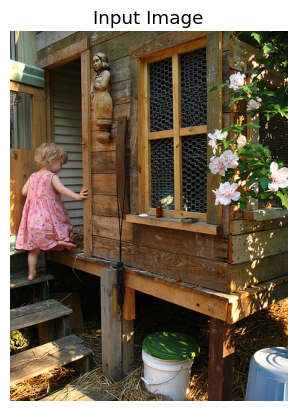

BLIP Caption: a little girl in a pink dress


In [61]:
# === Define image path (from Flickr8k dataset) ===
#image_folder = "/content/drive/MyDrive/flickr8k/Images"
image_folder = "Images"
image_file = "1000268201_693b08cb0e.jpg"
image_path = os.path.join(image_folder, image_file)

# === Load and display the image ===
image = Image.open(image_path).convert("RGB")
plt.imshow(image)
plt.axis("off")
plt.title("Input Image")
plt.show()

# === Process image and generate caption using BLIP ===
inputs = processor(images=image, return_tensors="pt")
out = model.generate(**inputs)
caption_blip = processor.decode(out[0], skip_special_tokens=True)

# === Print the generated caption ===
print(f"BLIP Caption: {caption_blip}")


### Generate Captions for Multiple Images Using BLIP

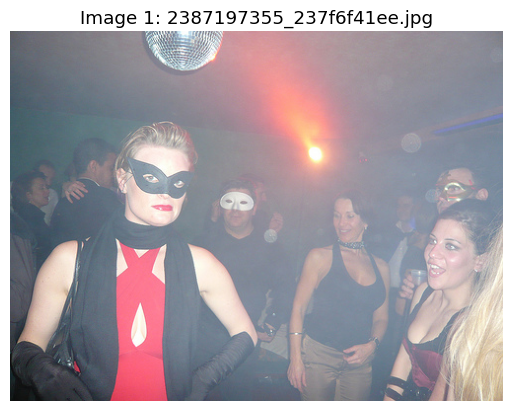

BLIP Caption for 2387197355_237f6f41ee.jpg: a woman in a red dress and a man in a black suit



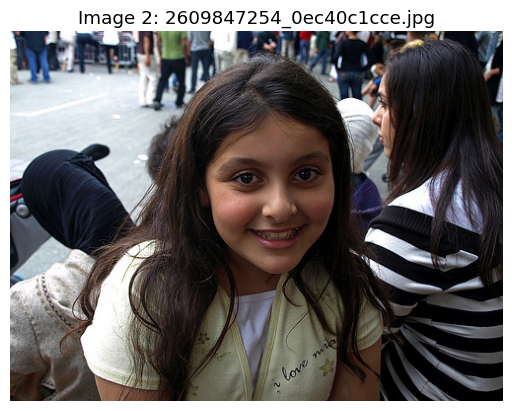

BLIP Caption for 2609847254_0ec40c1cce.jpg: a girl with long brown hair



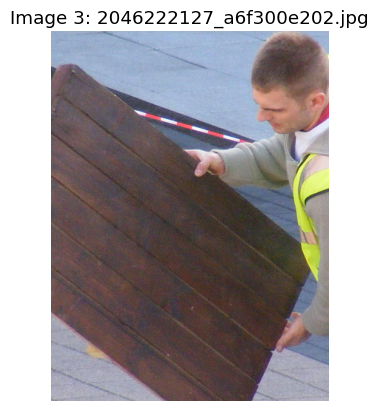

BLIP Caption for 2046222127_a6f300e202.jpg: a man carrying a large piece of wood



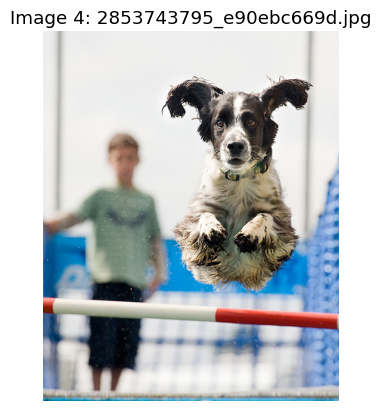

BLIP Caption for 2853743795_e90ebc669d.jpg: a dog jumping over a hurdle



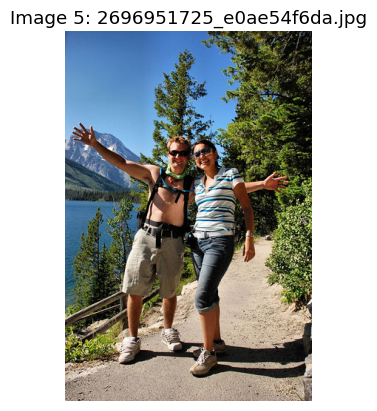

BLIP Caption for 2696951725_e0ae54f6da.jpg: a man and woman posing for a picture



In [62]:
# === Define path to Flickr8k image folder ===
#image_folder = "/content/drive/MyDrive/flickr8k/Images"
image_folder = "Images"

# === List all image files in the folder ===
image_files = os.listdir(image_folder)

# === Loop over the first 5 images, generate captions using BLIP ===
for i, img_file in enumerate(image_files[:5]):
    try:
        # Build full image path and load image
        img_path = os.path.join(image_folder, img_file)
        image = Image.open(img_path).convert("RGB")

        # Display image
        plt.imshow(image)
        plt.axis("off")
        plt.title(f"Image {i+1}: {img_file}")
        plt.show()

        # Generate caption using BLIP model
        inputs = processor(images=image, return_tensors="pt")
        out = model.generate(**inputs)
        caption = processor.decode(out[0], skip_special_tokens=True)

        # Print the generated caption
        print(f"BLIP Caption for {img_file}: {caption}\n")

    except Exception as e:
        # Handle errors gracefully (e.g., corrupted images)
        print(f"Error with {img_file}: {e}\n")


### Comparing DenseNet + LSTM vs BLIP (with BLEU Evaluation)

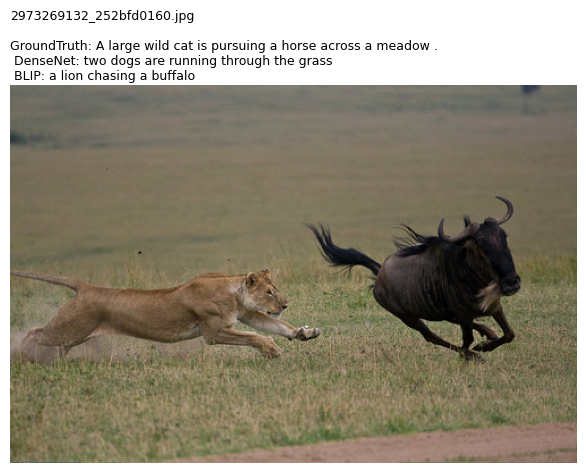

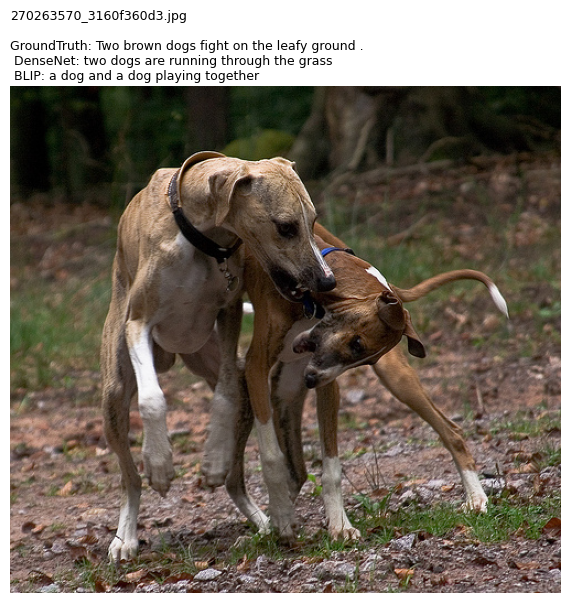

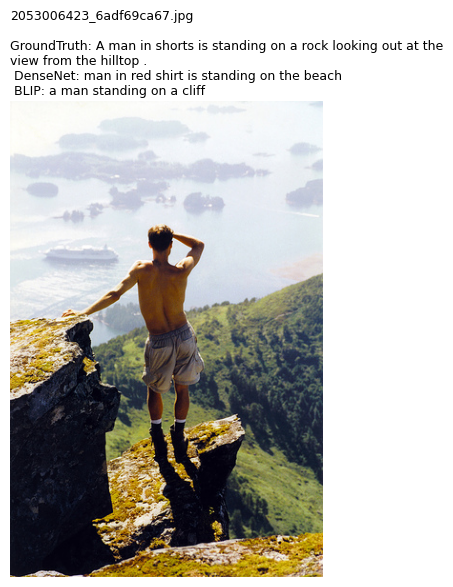

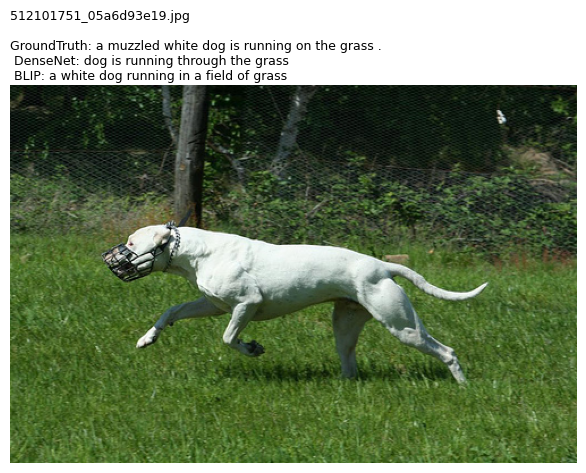

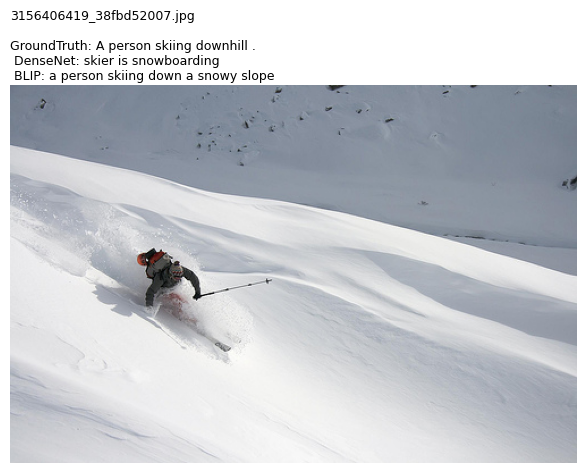

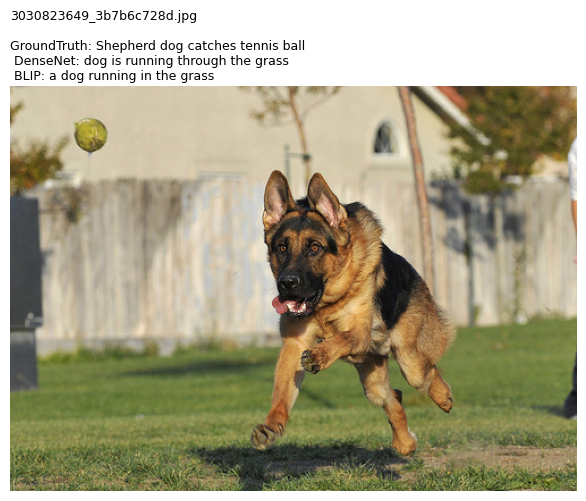

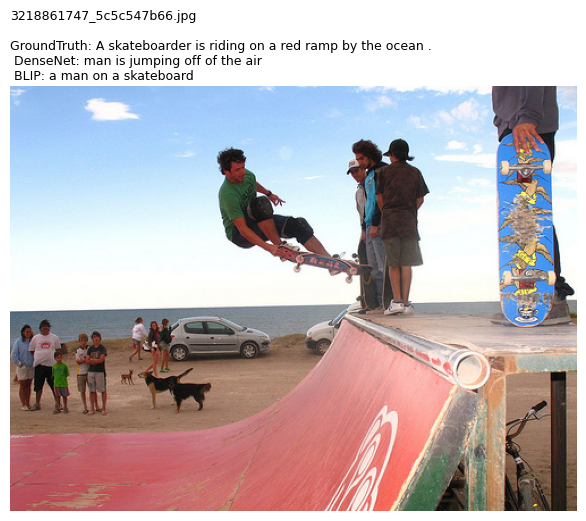

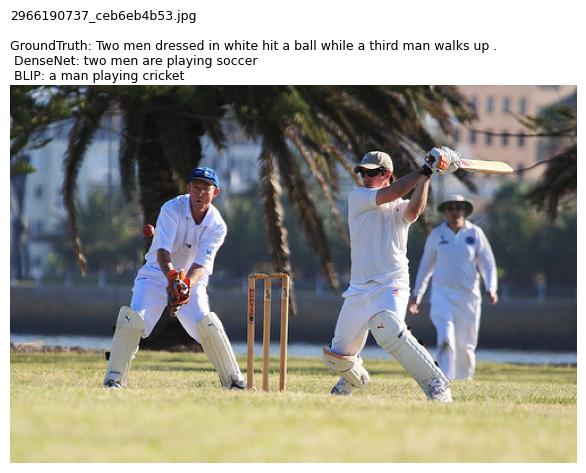

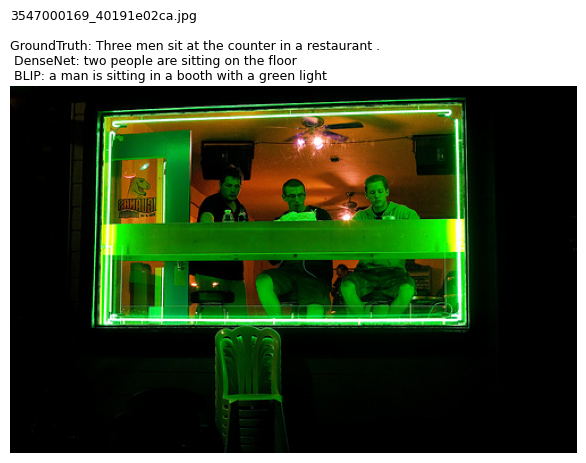

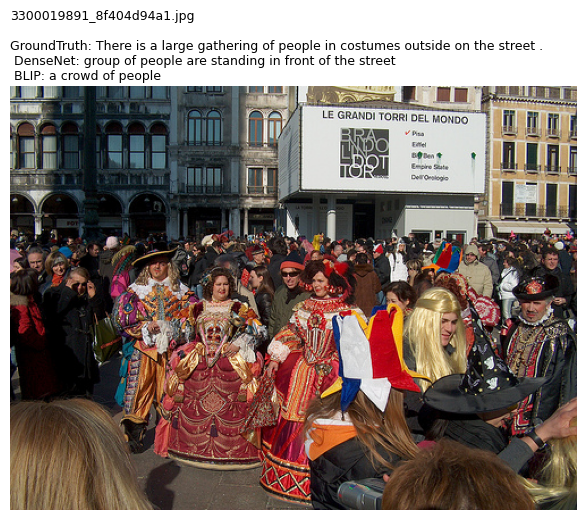


BLEU-1 Score Comparison:
DenseNet: 0.18068692378263357
BLIP: 0.17514538694395684


In [64]:
# === Import necessary libraries ===
import os
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
from nltk.tokenize import word_tokenize
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction

# === Define paths ===
#image_dir = "/content/drive/MyDrive/flickr8k/Images"
#captions_path = "/content/drive/MyDrive/flickr8k/captions.txt"
#features_path = "/content/features.pkl"
#tokenizer_path = "/content/tokenizer.pkl"
#dense_model_path = "/content/model.keras"
#max_length = 34

image_dir = "Images"
captions_path = "captions.txt"
features_path = "features.pkl"
tokenizer_path = "tokenizer.pkl"
dense_model_path = "model.keras"
max_length = 34

# === Load data and models ===
captions_df = pd.read_csv(captions_path)
with open(features_path, "rb") as f: features = pickle.load(f)
with open(tokenizer_path, "rb") as f: tokenizer = pickle.load(f)
dense_model = load_model(dense_model_path)

# === Load BLIP model and processor ===
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")
smoother = SmoothingFunction().method1

# === Helper: Convert token index to word ===
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

# === Generate captions using DenseNet+LSTM model ===
def predict_caption_generic(model, image_name, features, tokenizer, max_length):
    key = image_name if image_name in features else os.path.splitext(image_name)[0]
    feature = features.get(key)
    if feature is None:
        return ""
    feature = np.reshape(feature, (1, -1))
    in_text = 'startseq'
    for _ in range(max_length):
        seq = tokenizer.texts_to_sequences([in_text])[0]
        seq = pad_sequences([seq], maxlen=max_length)
        yhat = model.predict([feature, seq], verbose=0)
        word = idx_to_word(np.argmax(yhat), tokenizer)
        if word is None or word == 'endseq':
            break
        in_text += ' ' + word
    return in_text.replace("startseq", "").strip()

# === Generate captions using BLIP model ===
def predict_blip_caption(img_path):
    image = Image.open(img_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt")
    out = blip_model.generate(**inputs)
    return processor.decode(out[0], skip_special_tokens=True)

# === Compare captions and visualize results ===
def compare_models_with_visuals(df_sample):
    dense_preds, blip_preds, references = [], [], []

    for _, row in df_sample.iterrows():
        img_name = row['image']
        ref_caption = row['caption']
        full_path = os.path.join(image_dir, img_name)

        try:
            dense_caption = predict_caption_generic(dense_model, img_name, features, tokenizer, max_length)
            blip_caption = predict_blip_caption(full_path)

            image = Image.open(full_path)
            plt.figure(figsize=(6, 6))
            plt.imshow(image)
            plt.axis("off")
            plt.title(f"{img_name}\n\nGroundTruth: {ref_caption}\n DenseNet: {dense_caption}\n BLIP: {blip_caption}",
                      fontsize=9, loc='left', wrap=True)
            plt.tight_layout()
            plt.show()

            references.append([word_tokenize(ref_caption)])
            dense_preds.append(word_tokenize(dense_caption))
            blip_preds.append(word_tokenize(blip_caption))

        except Exception as e:
            print(f"Error processing {img_name}: {e}")

    return references, dense_preds, blip_preds

# === Run comparison on a sample of 10 images ===
sample_df = captions_df.sample(10, random_state=42).reset_index(drop=True)
refs, dense_outs, blip_outs = compare_models_with_visuals(sample_df)

# === Print BLEU-1 scores for DenseNet and BLIP ===
print("\nBLEU-1 Score Comparison:")
print("DenseNet:", corpus_bleu(refs, dense_outs, weights=(1, 0, 0, 0), smoothing_function=smoother))
print("BLIP:", corpus_bleu(refs, blip_outs, weights=(1, 0, 0, 0), smoothing_function=smoother))


### Install NLG-Eval for Advanced Metrics

In [65]:
# === Install NLG-Eval for advanced caption evaluation metrics (e.g., METEOR, CIDEr) ===
!pip install --no-deps git+https://github.com/Maluuba/nlg-eval.git


  Cloning https://github.com/Maluuba/nlg-eval.git to /private/var/folders/wn/f9dqwf512q52fzs0t0yk_4jw0000gn/T/pip-req-build-f6ahali7
  Running command git clone --filter=blob:none --quiet https://github.com/Maluuba/nlg-eval.git /private/var/folders/wn/f9dqwf512q52fzs0t0yk_4jw0000gn/T/pip-req-build-f6ahali7
  Resolved https://github.com/Maluuba/nlg-eval.git to commit 2ab4528fad5548315cf61e40c2249fec8c8ad233
  Preparing metadata (setup.py) ... done
  DEPRECATION: Building 'nlg-eval' using the legacy setup.py bdist_wheel mechanism, which will be removed in a future version. pip 25.3 will enforce this behaviour change. A possible replacement is to use the standardized build interface by setting the `--use-pep517` option, (possibly combined with `--no-build-isolation`), or adding a `pyproject.toml` file to the source tree of 'nlg-eval'. Discussion can be found at https://github.com/pypa/pip/issues/6334
  Created wheel for nlg-eval: filename=nlg_eval-2.4.1-py3-none-any.whl size=98924428 sha2

### Compute NLG Metrics for DenseNet and BLIP

In [66]:
from nlgeval import NLGEval
nlgeval = NLGEval(no_skipthoughts=True, no_glove=True, metrics_to_omit=["SPICE"])

dense_metrics = []
blip_metrics = []

for i in range(len(refs)):
    ref_str = [' '.join(refs[i][0])]
    dense = ' '.join(dense_outs[i])
    blip = ' '.join(blip_outs[i])

    dense_result = nlgeval.compute_individual_metrics(ref_str, dense)
    blip_result = nlgeval.compute_individual_metrics(ref_str, blip)

    dense_metrics.append(dense_result)
    blip_metrics.append(blip_result)

def avg_metrics(metrics_list):
    return {k: np.mean([m[k] for m in metrics_list]) for k in metrics_list[0]}

avg_dense = avg_metrics(dense_metrics)
avg_blip = avg_metrics(blip_metrics)

print("\nAverage NLG Metrics Comparison:")
print(f"{'Metric':<20}{'DenseNet':<15}{'BLIP':<15}")
for key in avg_dense:
    print(f"{key:<20}{avg_dense[key]:<15.4f}{avg_blip[key]:<15.4f}")


Will try with limiting Meteor to 1GB of memory but this might cause issues.
If you have problems using Meteor, then you can try to lower the `mem` variable in meteor.py



Average NLG Metrics Comparison:
Metric              DenseNet       BLIP           
Bleu_1              0.1650         0.1512         
Bleu_2              0.0770         0.0778         
Bleu_3              0.0378         0.0055         
Bleu_4              0.0000         0.0000         
METEOR              0.1115         0.1165         
ROUGE_L             0.2258         0.2479         
CIDEr               0.0000         0.0000         


### Import Libraries for CLIP Evaluation

In [5]:
import torch
import clip
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pickle
import pandas as pd


### Load Models and Data

In [6]:
# === Define paths ===
#image_dir = "/content/drive/MyDrive/flickr8k/Images"
#captions_path = "/content/drive/MyDrive/flickr8k/captions.txt"
#features_path = "/content/features.pkl"
#tokenizer_path = "/content/tokenizer.pkl"
#dense_model_path = "/content/model.keras"
#max_length = 34

image_dir = "Images"
captions_path = "captions.txt"
features_path = "features.pkl"
tokenizer_path = "tokenizer.pkl"
dense_model_path = "model.keras"
max_length = 34

# === Load Flickr8k captions and DenseNet+LSTM model components ===
captions_df = pd.read_csv(captions_path)
with open(features_path, "rb") as f: features = pickle.load(f)
with open(tokenizer_path, "rb") as f: tokenizer = pickle.load(f)
dense_model = load_model(dense_model_path)


### Load CLIP and BLIP Models

This cell:

Loads the CLIP model (ViT-B/32) for image-text similarity evaluation.

Loads the BLIP model for image captioning.

In [1]:
import torch
import clip
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration

device = "cuda" if torch.cuda.is_available() else "cpu"

clip_model, preprocess_clip = clip.load("ViT-B/32", device=device)


/opt/anaconda3/envs/imgcap/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|███████████████████████████████████████| 338M/338M [00:24<00:00, 14.3MiB/s]


In [8]:
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
blip_model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


### Define Captioning and CLIP Scoring Functions

This cell defines:

predict_blip_caption(): Generate captions using BLIP.

predict_dense_caption(): Generate captions using DenseNet+LSTM.

compute_clip_similarity(): Compute similarity between an image and multiple captions using CLIP.



In [2]:
# === Function to generate a caption for an image using BLIP ===
def predict_blip_caption(img_path):
    image = Image.open(img_path).convert("RGB")  # Load and convert image to RGB
    inputs = processor(images=image, return_tensors="pt")  # Prepare image for BLIP
    out = blip_model.generate(**inputs)  # Generate caption tokens
    return processor.decode(out[0], skip_special_tokens=True)  # Decode caption to text

# === Function to map an integer index to a word using the tokenizer ===
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

# === Function to generate a caption for an image using DenseNet+LSTM model ===
def predict_dense_caption(model, image_name, tokenizer, features, max_length):
    key = image_name if image_name in features else os.path.splitext(image_name)[0]  # Get image key
    feature = features.get(key)  # Fetch pre-extracted feature vector
    if feature is None:
        return ""
    
    feature = np.reshape(feature, (1, -1))  # Reshape for model input
    in_text = 'startseq'  # Start token
    
    for _ in range(max_length):
        seq = tokenizer.texts_to_sequences([in_text])[0]
        seq = pad_sequences([seq], maxlen=max_length)
        yhat = model.predict([feature, seq], verbose=0)
        word = idx_to_word(np.argmax(yhat), tokenizer)  # Map predicted index to word
        
        if word is None or word == 'endseq':
            break
        in_text += ' ' + word
    
    return in_text.replace("startseq", "").strip()

# === Function to compute similarity scores between an image and multiple captions using CLIP ===
def compute_clip_similarity(image_path, captions):
    image = preprocess_clip(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)  # Preprocess image for CLIP
    text = clip.tokenize(captions).to(device)  # Tokenize captions for CLIP

    with torch.no_grad():
        image_features = clip_model.encode_image(image)  # Get image embeddings
        text_features = clip_model.encode_text(text)  # Get text embeddings

        # Normalize feature vectors
        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)

        # Compute similarity scores (softmaxed over captions)
        similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)

    return similarity[0].tolist()  # Return list of similarity scores (one per caption)


### Compare DenseNet, BLIP, and Ground Truth with CLIP Scores

This cell:

Samples 5 random images from the dataset.

For each image:

Generates a caption using DenseNet+LSTM and BLIP.

Computes similarity scores (CLIP) between the image and:

Ground-truth caption

DenseNet caption

BLIP caption

Displays the image and prints captions + scores for comparison.

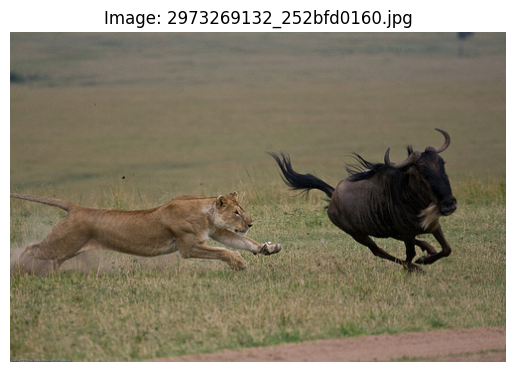

Ground Truth: A large wild cat is pursuing a horse across a meadow . → CLIP Score: 0.2885
DenseNet: two dogs are running through the grass → CLIP Score: 0.0001
BLIP: a lion chasing a buffalo → CLIP Score: 0.7114


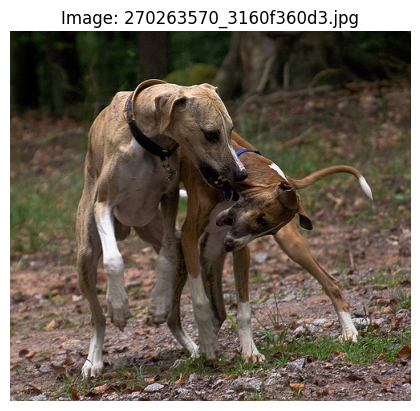

Ground Truth: Two brown dogs fight on the leafy ground . → CLIP Score: 0.6275
DenseNet: two dogs are running through the grass → CLIP Score: 0.0179
BLIP: a dog and a dog playing together → CLIP Score: 0.3547


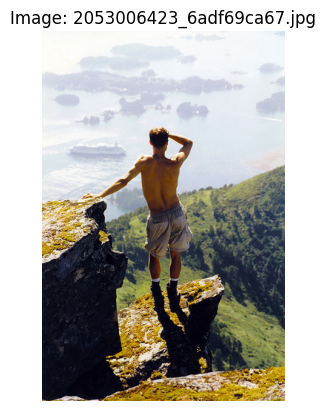

Ground Truth: A man in shorts is standing on a rock looking out at the view from the hilltop . → CLIP Score: 0.9828
DenseNet: man in red shirt is standing on the beach → CLIP Score: 0.0000
BLIP: a man standing on a cliff → CLIP Score: 0.0172


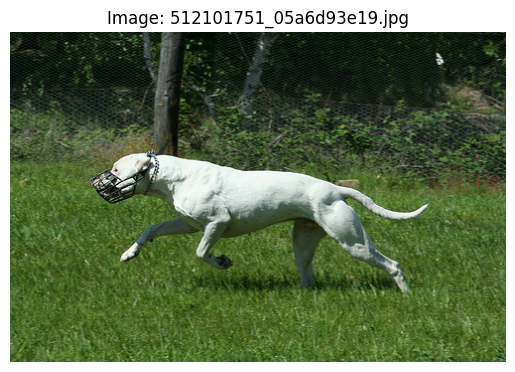

Ground Truth: a muzzled white dog is running on the grass . → CLIP Score: 0.8928
DenseNet: dog is running through the grass → CLIP Score: 0.0016
BLIP: a white dog running in a field of grass → CLIP Score: 0.1056


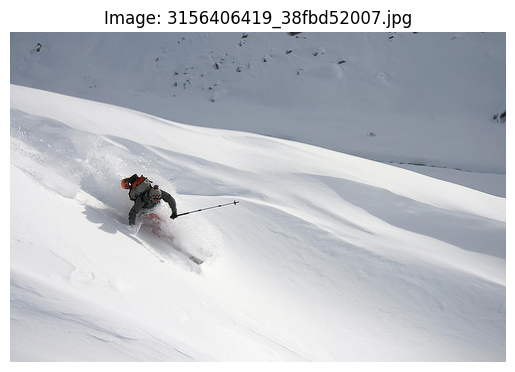

Ground Truth: A person skiing downhill . → CLIP Score: 0.3942
DenseNet: skier is snowboarding → CLIP Score: 0.0151
BLIP: a person skiing down a snowy slope → CLIP Score: 0.5908


In [9]:
# === Sample 5 random images from the dataset for comparison ===
sample_df = captions_df.sample(5, random_state=42).reset_index(drop=True)

# === Loop over each sampled image ===
for _, row in sample_df.iterrows():
    img_file = row['image']
    ref_caption = row['caption']
    img_path = os.path.join(image_dir, img_file)

    # Generate captions from DenseNet+LSTM and BLIP
    dense_caption = predict_dense_caption(dense_model, img_file, tokenizer, features, max_length)
    blip_caption = predict_blip_caption(img_path)

    # Compute CLIP similarity scores for Ground Truth, DenseNet, and BLIP captions
    similarity_scores = compute_clip_similarity(img_path, [ref_caption, dense_caption, blip_caption])

    # Display the image
    image = Image.open(img_path).convert("RGB")
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Image: {img_file}")
    plt.show()

    # Print the captions and their respective CLIP scores
    print("Ground Truth:", ref_caption, f"→ CLIP Score: {similarity_scores[0]:.4f}")
    print("DenseNet:", dense_caption, f"→ CLIP Score: {similarity_scores[1]:.4f}")
    print("BLIP:", blip_caption, f"→ CLIP Score: {similarity_scores[2]:.4f}")
    print("="*80)


### Blip model summary 

The above section compares **DenseNet+LSTM** and **BLIP** captions for a few sample images using **CLIP similarity scores**. For each image, we display:

* The **Ground Truth (GT)** caption.
* The **DenseNet+LSTM** generated caption.
* The **BLIP** generated caption.
* The **CLIP similarity score** for each caption, showing how closely it matches the actual image content.

From the outputs:

* **BLIP captions consistently score higher** on the CLIP metric, often aligning more closely with the image’s visual content (e.g., “a lion chasing a buffalo”).
* **DenseNet captions sometimes miss the main objects** (e.g., saying “dog running in the grass” when the image shows a lion and a buffalo).
* The **Ground Truth captions** have moderate CLIP scores as they are human-written but not always perfectly literal.

This shows that **BLIP generally generates more accurate and descriptive captions** compared to the older DenseNet+LSTM baseline, especially when using external models like CLIP for evaluation.
